KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------

<span style="color:red">**TODO**: Add your names below.</span>

<span style="color:red">**TODO**: Change the notebook name by replacing the X with your actual group number.</span>

Student names: <span style="color:red">name1, name2, ...</span>.

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions.

The notebook you submit for grading is the last notebook pinned as default and submitted to the competition prior to the deadline.

Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*.


# Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook, with a final discussion:
* Image classification (Sect. 1)
* Semantic segmentation (Sect. 2)
* Adversarial attacks (Sect. 3)
* Discussion (Sect. 4)

## Deep learning resources
If you did not yet explore this in *Group assignment 1 (Sect. 2)*, we recommend using the Pytorch or TensorFlow (and/or Keras) library for building deep learning models.

In [3]:
# !pip install numpy
# !pip install pandas
# !pip install torch
# !pip install torchvision
# !pip install matplotlib
!pip install --force-reinstall torch torchvision --index-url https://download.pytorch.org/whl/cu128

Looking in indexes: https://download.pytorch.org/whl/cu128
  Using cached https://download-r2.pytorch.org/whl/cu128/torch-2.11.0%2Bcu128-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (29 kB)
  Using cached https://download-r2.pytorch.org/whl/cu128/torchvision-0.26.0%2Bcu128-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (5.5 kB)
  Using cached filelock-3.25.2-py3-none-any.whl.metadata (2.0 kB)
  Using cached https://download.pytorch.org/whl/typing_extensions-4.15.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached https://download.pytorch.org/whl/setuptools-70.2.0-py3-none-any.whl.metadata (5.8 kB)
  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached networkx-3.6.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached https://download.pytorch.org/whl/jinja2-3.1.6-py3-none-any.whl.metadata (2.9 kB)
  Using cached fsspec-2026.2.0-py3-none-any.whl.metadata (10 kB)
  Using cached https://download.pytorch.org/whl/cu128/cuda_bindings-12.9.4-cp312-cp312-manylinux_2_24_x86

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from matplotlib import pyplot as plt


## PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


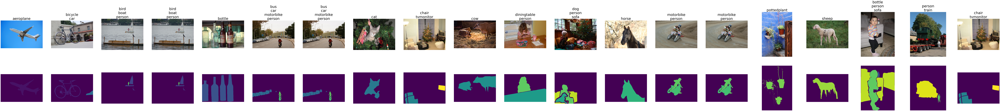

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
# Loading the training data
train_df = pd.read_csv('./kul-computer-vision-ga-2-2026/train/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load('./kul-computer-vision-ga-2-2026/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load('./kul-computer-vision-ga-2-2026/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples196
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [3]:
# Loading the test data
test_df = pd.read_csv('./kul-computer-vision-ga-2-2026/test/test_set.csv', index_col="Id")
test_df["img"] = [np.load('./kul-computer-vision-ga-2-2026/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


Calculating metrics later used in training.

In [4]:
heights = train_df["img"].apply(lambda x: x.shape[0])
widths  = train_df["img"].apply(lambda x: x.shape[1])

pos_counts = train_df[labels].sum(axis=0).values        # positives per class
neg_counts = len(train_df) - pos_counts                  # negatives per class
pos_weight = torch.tensor(neg_counts / pos_counts,
                          dtype=torch.float32)
print(f"Max height : {heights.max()}")
print(f"Max width  : {widths.max()}")
print(f"Min height : {heights.min()}")
print(f"Min width  : {widths.min()}")
print(f"Mean height: {heights.mean():.1f}")
print(f"Mean width : {widths.mean():.1f}")
print("\nPositive counts", pos_counts)
print("Negative counts", neg_counts)
print("Positive weights", pos_weight)

Max height : 500
Max width  : 500
Min height : 112
Min width  : 257
Mean height: 383.1
Mean width : 471.8

Positive counts [ 47  39  55  48  42  38  63  45  69  30  48  43  42  47 207  43  27  44
  40  51]
Negative counts [702 710 694 701 707 711 686 704 680 719 701 706 707 702 542 706 722 705
 709 698]
Positive weights tensor([14.9362, 18.2051, 12.6182, 14.6042, 16.8333, 18.7105, 10.8889, 15.6444,
         9.8551, 23.9667, 14.6042, 16.4186, 16.8333, 14.9362,  2.6184, 16.4186,
        26.7407, 16.0227, 17.7250, 13.6863])


Computing mean and std deviation for normalisation.

In [5]:
# compute VOC-specific normalization stats without stacking
# iterates image by image to handle variable sizes
mean = np.zeros(3)
std  = np.zeros(3)
n_pixels = 0

for img in train_df["img"]:
    img_float = img.astype(np.float32) / 255.0  # (H, W, 3)
    h, w      = img_float.shape[:2]
    n         = h * w

    mean     += img_float.sum(axis=(0, 1))       # sum over H and W per channel
    n_pixels += n

mean /= n_pixels  # global mean per channel

# second pass for std — need mean first
for img in train_df["img"]:
    img_float = img.astype(np.float32) / 255.0
    std      += ((img_float - mean) ** 2).sum(axis=(0, 1))

std = np.sqrt(std / n_pixels)

print(f"VOC mean: {mean}")
print(f"VOC std:  {std}")

VOC mean: [0.45472244 0.44289625 0.40782569]
VOC std:  [0.2720892  0.26797562 0.28442318]


## Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [6]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 1. Image classification
The task here is a multi-classification problem, below are the potential challenges for this task.
1. Variable image sizes: A neural network needs a fixed input.
2. Independent label classification: More than 1 label can be present in the same image.
3. Potential class imbalance: Some classes maybe more frequent than others.
4. Small dataset: may overfit.

Popular choices of types of models would include 2 main components: CNN and ViT. The main difference between these two is the inductive bias of CNN due to limited ability to learn spatial relations, whereas ViT transforms the image into multiple tokens which when combined with positional embeddings can learn global spatial relations better.

Although ViT could be advantageous here as it could learn dependant spatial relationships, for example, "sky is always up" however, we decided to move with CNN first as the core problem at hand is to identify wether an object is present in the image or not which does not really require global long-range dependencies, hence using ViT may not result into significant performance increase. Saving in terms of computation requirement, train dataset size as well as models complexity.

In [7]:
# Class to handle the datasets.
class VOCDataset(Dataset):
    def __init__(self, df, target_labels, transform=None, inference=False):
        self.df            = df
        self.target_labels = target_labels
        self.transform     = transform
        self.inference     = inference

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = row["img"].astype(np.uint8)

        if self.transform:
            img = self.transform(img)

        if self.inference:
            return img

        # only return the target label columns, not all 20
        labels = torch.tensor(
            row[self.target_labels].values.astype(np.float32)
        )
        return img, labels

A class encapsulating various loss functions to be used later.

In [8]:
class FocalLoss(nn.Module):
    """
    Focal loss for binary classification.
    
    Down-weights easy examples (high confidence correct predictions)
    so training focuses on hard misclassified examples.
    gamma=0 → identical to BCE
    gamma=2 → standard focal loss from the original paper
    """
    def __init__(self, gamma=2.0, pos_weight=None):
        super().__init__()
        self.gamma      = gamma
        self.pos_weight = pos_weight

    def forward(self, logits, targets):
        # standard BCE per element
        bce = F.binary_cross_entropy_with_logits(
            logits, targets,
            pos_weight=self.pos_weight,
            reduction="none"
        )
        # probability of the true class
        probs = torch.sigmoid(logits)
        p_t   = probs * targets + (1 - probs) * (1 - targets)

        # down-weight easy examples
        focal_weight = (1 - p_t) ** self.gamma
        return (focal_weight * bce).mean()

class SmoothBCELoss(nn.Module):
    """
    BCE loss with label smoothing.
    
    Replaces hard 0/1 labels with smoothed versions:
        positive: 1.0 → (1 - smoothing)
        negative: 0.0 → smoothing
    
    Prevents overconfidence and improves calibration.
    
    Parameters
    ----------
    smoothing : float - smoothing factor (default 0.1)
    """
    def __init__(self, smoothing=0.1, pos_weight=None):
        super().__init__()
        self.smoothing  = smoothing
        self.pos_weight = pos_weight

    def forward(self, logits, targets):
        # smooth the targets
        targets_smooth = targets * (1 - self.smoothing) + \
                         (1 - targets) * self.smoothing
        return F.binary_cross_entropy_with_logits(
            logits, targets_smooth,
            pos_weight=self.pos_weight,
            reduction="mean"
        )
    
class FocalSmoothLoss(nn.Module):
    def __init__(self, gamma=2.0, smoothing=0.1, pos_weight=None):
        super().__init__()
        self.gamma      = gamma
        self.smoothing  = smoothing
        self.pos_weight = pos_weight

    def forward(self, logits, targets):
        targets_smooth = targets * (1 - self.smoothing) + \
                         (1 - targets) * self.smoothing
        bce   = F.binary_cross_entropy_with_logits(
            logits, targets_smooth,
            pos_weight=self.pos_weight,
            reduction="none"
        )
        probs  = torch.sigmoid(logits)
        p_t    = probs * targets + (1 - probs) * (1 - targets)
        return ((1 - p_t) ** self.gamma * bce).mean()

As mentioned in the discussion above, we will be only focusing on different archtiectures of neural network. The class "VocClassifier" consist of various flags that allows for easy manipulation of the architecture. Most of these flags were added during the experimentation phase while allowing backward compatibility. The reasons for the flags added will be demonstrated as we progress thorugh the notebook.

In [9]:
class VocClassifier(nn.Module):
    """
    Custom CNN for multi-label classification on PASCAL VOC 2009,
    trained from scratch.

    Can be instantiated for any subset of classes via target_labels:
        - Single class : target_labels=['person']  → binary classifier
        - Multi class  : target_labels=['cat','dog'] → multi-label on subset
        - All classes  : target_labels=labels        → full 20-class problem

    Parameters
    ----------
    target_labels   : list[str] - class(es) to train on
    dropout         : float     - dropout in classification head
    deep_head       : bool      - adds extra 256->128 layer in head
    use_se          : bool      - adds SE blocks after residual blocks
    num_stages      : int       - number of conv stages (3, 4 or 5)
    learnable_thres : bool      - learns per-class decision threshold
    """
    def __init__(self, target_labels, dropout=0.5,
                 deep_head=False, use_se=False,
                 num_stages=5, learnable_thres=False):
        super().__init__()
        assert num_stages in (3, 4, 5), "num_stages must be 3, 4 or 5"

        self.target_labels = target_labels
        self.num_classes   = len(target_labels)
        self.learn_thres   = learnable_thres

        # ── Backbone stages ───────────────────────────────────────────────────
        # Stage 1: single conv — simple edge/colour detectors
        self.stage1 = nn.Sequential(
            self._conv_bn_relu(3, 32, kernel_size=7),
            nn.MaxPool2d(kernel_size=2, stride=2)           # 224 -> 112
        )

        # Stage 2: residual block — low-level pattern refinement
        self.stage2 = nn.Sequential(
            self._residual_block(32, 64, use_se=use_se),
            nn.MaxPool2d(kernel_size=2, stride=2)           # 112 -> 56
        )

        # Stage 3: residual block — object-part features
        self.stage3 = nn.Sequential(
            self._residual_block(64, 128, use_se=use_se),
            nn.MaxPool2d(kernel_size=2, stride=2)           # 56 -> 28
        )

        # Stage 4: residual block — semantic features (optional)
        if num_stages >= 4:
            self.stage4 = nn.Sequential(
                self._residual_block(128, 256, use_se=use_se),
                nn.MaxPool2d(kernel_size=2, stride=2)       # 28 -> 14
            )
        else:
            self.stage4 = None

        # Stage 5: single conv — highly abstract representations (optional)
        if num_stages >= 5:
            self.stage5 = nn.Sequential(
                self._conv_bn_relu(256, 512),
                nn.MaxPool2d(kernel_size=2, stride=2)       # 14 -> 7
            )
        else:
            self.stage5 = None

        # GAP: collapses spatial dims regardless of input size
        self.gap = nn.AdaptiveAvgPool2d((1, 1))

        # head input depends on final active stage
        stage_channels = {3: 128, 4: 256, 5: 512}
        head_in        = stage_channels[num_stages]

        # ── Classification head ───────────────────────────────────────────────
        # No Sigmoid — BCEWithLogitsLoss expects raw logits
        if deep_head:
            self.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Linear(head_in, 256),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout),
                nn.Linear(256, 128),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout),
                nn.Linear(128, self.num_classes)
            )
        else:
            self.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Linear(head_in, 256),
                nn.ReLU(inplace=True),
                nn.Dropout(p=dropout),
                nn.Linear(256, self.num_classes)
            )

        # learnable per-class threshold shift
        if learnable_thres:
            self.class_bias = nn.Parameter(torch.zeros(self.num_classes))

        self._init_weights()

    # ── Private building blocks ───────────────────────────────────────────────
    def _conv_bn_relu(self, in_channels, out_channels, kernel_size=3):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size,
                      padding=kernel_size // 2,
                      bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def _residual_block(self, in_channels, out_channels, use_se=False):
        outer_self = self

        class _ResidualBlock(nn.Module):

            def __init__(inner_self, use_se=False):
                super().__init__()
                inner_self.conv1 = outer_self._conv_bn_relu(in_channels,  out_channels)
                inner_self.conv2 = outer_self._conv_bn_relu(out_channels, out_channels)
                inner_self.relu  = nn.ReLU(inplace=True)

                if in_channels != out_channels:
                    inner_self.shortcut = nn.Sequential(
                        nn.Conv2d(in_channels, out_channels,
                                  kernel_size=1, bias=False),
                        nn.BatchNorm2d(out_channels)
                    )
                else:
                    inner_self.shortcut = nn.Identity()

                if use_se:
                    reduction = max(4, out_channels // 16)  # min 4 to avoid collapse
                    inner_self.se = nn.Sequential(
                        nn.AdaptiveAvgPool2d(1),
                        nn.Flatten(),
                        nn.Linear(out_channels, reduction, bias=False),
                        nn.ReLU(inplace=True),
                        nn.Linear(reduction, out_channels, bias=False),
                        nn.Sigmoid(),
                    )
                else:
                    inner_self.se = None

            def forward(inner_self, x):
                residual = inner_self.shortcut(x)
                out      = inner_self.conv1(x)
                out      = inner_self.conv2(out)
                if inner_self.se is not None:
                    scale = inner_self.se(out).unsqueeze(-1).unsqueeze(-1)
                    out   = out * scale
                return inner_self.relu(out + residual)

        return _ResidualBlock(use_se=use_se)

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out",
                                        nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    # ── Forward ───────────────────────────────────────────────────────────────
    def forward(self, x):
        x = self.stage1(x)
        x = self.stage2(x)
        x = self.stage3(x)
        if self.stage4 is not None:
            x = self.stage4(x)
        if self.stage5 is not None:
            x = self.stage5(x)
        x = self.gap(x)
        x = self.classifier(x)
        if self.learn_thres:
            x = x + self.class_bias
        return x

    # ── Private training helpers ──────────────────────────────────────────────
    def _train_one_epoch(self, loader, criterion, optimizer, device):
        self.train()
        total_loss = 0.0
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            loss = criterion(self(imgs), labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        return total_loss / len(loader)

    def _evaluate(self, loader, criterion, device, threshold):
        self.eval()
        total_loss = 0.0
        all_preds, all_labels = [], []
        with torch.no_grad():
            for imgs, labels in loader:
                imgs, labels = imgs.to(device), labels.to(device)
                logits = self(imgs)
                total_loss += criterion(logits, labels).item()
                preds = (torch.sigmoid(logits) > threshold).float()
                all_preds.append(preds.cpu())
                all_labels.append(labels.cpu())

        all_preds  = torch.cat(all_preds,  dim=0).numpy()
        all_labels = torch.cat(all_labels, dim=0).numpy()

        f1_scores = []
        for c in range(all_labels.shape[1]):
            tp    = ((all_preds[:, c] == 1) & (all_labels[:, c] == 1)).sum()
            fp    = ((all_preds[:, c] == 1) & (all_labels[:, c] == 0)).sum()
            fn    = ((all_preds[:, c] == 0) & (all_labels[:, c] == 1)).sum()
            denom = 2 * tp + fp + fn
            f1_scores.append((2 * tp / denom) if denom > 0 else 0.0)

        return total_loss / len(loader), float(np.mean(f1_scores))

    def _predict(self, loader, device, threshold):
        self.eval()
        all_preds = []
        with torch.no_grad():
            for imgs in loader:
                preds = (torch.sigmoid(self(imgs.to(device))) > threshold).int()
                all_preds.append(preds.cpu())
        return torch.cat(all_preds, dim=0).numpy()

    # ── Public API ────────────────────────────────────────────────────────────
    def fit(self, train_df, test_df,
        img_size_H=224, img_size_W=224, batch_size=32,
        num_epochs=30, lr=1e-3, val_split=0.15,
        threshold=0.5, pos_weight=None, use_augmentation=False,
        loss_fn='bce', normalize=None):

        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print(f"Using device  : {device}")
        print(f"Target classes: {self.target_labels}")
        self.to(device)

        # ── Splits ────────────────────────────────────────────────────────
        n_val  = int(len(train_df) * val_split)
        val_df = train_df.iloc[:n_val].reset_index(drop=True)
        tr_df  = train_df.iloc[n_val:].reset_index(drop=True)

        # ── Transforms ────────────────────────────────────────────────────
        if use_augmentation:
            train_transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((img_size_H, img_size_W)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.ColorJitter(brightness=0.3, contrast=0.3,
                                    saturation=0.3),
                transforms.RandomRotation(degrees=15),
                transforms.RandomGrayscale(p=0.1),
                transforms.ToTensor(),
                *([normalize] if normalize is not None else [])  # ← append if provided
            ])
        else:
            train_transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((img_size_H, img_size_W)),
                transforms.ToTensor(),
                *([normalize] if normalize is not None else [])  # ← append if provided
            ])

        val_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((img_size_H, img_size_W)),
            transforms.ToTensor(),
            *([normalize] if normalize is not None else [])      # ← append if provided
        ])

        # ── Datasets & loaders ────────────────────────────────────────────
        train_loader = DataLoader(
            VOCDataset(tr_df,   self.target_labels, transform=train_transform),
            batch_size=batch_size, shuffle=True,
            num_workers=2, pin_memory=True
        )
        val_loader = DataLoader(
            VOCDataset(val_df,  self.target_labels, transform=val_transform),
            batch_size=batch_size, shuffle=False,
            num_workers=2, pin_memory=True
        )
        test_loader = DataLoader(
            VOCDataset(test_df, self.target_labels, transform=val_transform,
                       inference=True),
            batch_size=batch_size, shuffle=False,
            num_workers=2, pin_memory=True
        )

        # ── Loss, optimiser, scheduler ────────────────────────────────────
        if loss_fn == 'focal':
            criterion = FocalLoss(
                gamma=2.0,
                pos_weight=pos_weight.to(device) if pos_weight is not None else None
            )
        elif loss_fn == 'smooth':
            criterion = SmoothBCELoss(
                smoothing=0.1,
                pos_weight=pos_weight.to(device) if pos_weight is not None else None
            )
        elif loss_fn == 'focal_smooth':
            criterion = FocalSmoothLoss(
                gamma=2.0, smoothing=0.1,
                pos_weight=pos_weight.to(device) if pos_weight is not None else None
            )
        else:
            criterion = nn.BCEWithLogitsLoss(
                pos_weight=pos_weight.to(device) if pos_weight is not None else None
            )
        optimizer = optim.Adam(self.parameters(), lr=lr)
        
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode="min", factor=0.5, patience=3
        )

        # ── Training loop ─────────────────────────────────────────────────
        history        = {"train_loss": [], "val_loss": [], "val_f1": []}
        best_val_f1    = 0.0
        best_state     = None

        for epoch in range(1, num_epochs + 1):
            train_loss       = self._train_one_epoch(train_loader, criterion,
                                                     optimizer, device)
            val_loss, val_f1 = self._evaluate(val_loader, criterion,
                                              device, threshold)
            scheduler.step(val_loss)

            history["train_loss"].append(train_loss)
            history["val_loss"].append(val_loss)
            history["val_f1"].append(val_f1)

            # track best checkpoint
            marker = ""
            if val_f1 > best_val_f1:
                best_val_f1 = val_f1
                best_state  = {k: v.clone() for k, v in self.state_dict().items()}
                marker      = "  ← best"

            print(f"Epoch {epoch:>3}/{num_epochs} | "
                  f"train_loss: {train_loss:.4f} | "
                  f"val_loss: {val_loss:.4f} | "
                  f"val_F1: {val_f1:.4f}{marker}")

        # restore best weights before predicting
        if best_state is not None:
            self.load_state_dict(best_state)
            print(f"\nRestored best checkpoint (val_F1: {best_val_f1:.4f})")

        # ── Fill test_df — only target label columns ──────────────────────
        predictions = self._predict(test_loader, device, threshold)
        test_df.loc[:, self.target_labels] = predictions

        print(f"Done. Filled columns: {self.target_labels}")
        return history

A few supporting functions.

In [10]:
def tune_thresholds(model, val_df, labels, img_size_H=224, img_size_W=224, 
                    batch_size=32, device=None):
    """
    Finds the best sigmoid threshold per class on the validation set
    by maximising per-class F1, then returns the thresholds and prints
    a summary. Run this after training, before predicting on test set.

    Parameters
    ----------
    model      : trained VocClassifier
    val_df     : pd.DataFrame - the validation split (same as used in fit)
    labels     : list[str]   - the 20 VOC class names
    img_size_H : int         - same value used during training
    img_size_W : int         - same value used during training
    batch_size : int
    device     : torch.device - if None, auto-detects cuda/cpu

    Returns
    -------
    best_thresholds : list[float] - one threshold per class, in label order
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    val_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((img_size_H, img_size_W)),
        transforms.ToTensor(),
    ])

    val_loader = DataLoader(
        VOCDataset(val_df, labels, transform=val_transform),
        batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True
    )

    # ── collect all probabilities and ground truth in one pass ────────────
    model.eval()
    all_probs, all_labels = [], []

    with torch.no_grad():
        for imgs, lbls in val_loader:
            probs = torch.sigmoid(model(imgs.to(device)))
            all_probs.append(probs.cpu())
            all_labels.append(lbls)

    all_probs  = torch.cat(all_probs,  dim=0).numpy()  # (N, 20)
    all_labels = torch.cat(all_labels, dim=0).numpy()  # (N, 20)

    # ── search best threshold per class ───────────────────────────────────
    thresholds_to_try = np.arange(0.05, 0.95, 0.05)
    best_thresholds   = []

    print(f"{'Class':<20} {'Best Threshold':>15} {'F1 @ 0.5':>10} {'F1 @ best':>10}")
    print("-" * 60)

    for c, label in enumerate(labels):
        # F1 at default threshold for comparison
        preds_default = (all_probs[:, c] > 0.5).astype(int)
        tp    = ((preds_default == 1) & (all_labels[:, c] == 1)).sum()
        fp    = ((preds_default == 1) & (all_labels[:, c] == 0)).sum()
        fn    = ((preds_default == 0) & (all_labels[:, c] == 1)).sum()
        denom = 2 * tp + fp + fn
        f1_default = (2 * tp / denom) if denom > 0 else 0.0

        # search over thresholds
        best_f1, best_t = 0.0, 0.5
        for t in thresholds_to_try:
            preds = (all_probs[:, c] > t).astype(int)
            tp    = ((preds == 1) & (all_labels[:, c] == 1)).sum()
            fp    = ((preds == 1) & (all_labels[:, c] == 0)).sum()
            fn    = ((preds == 0) & (all_labels[:, c] == 1)).sum()
            denom = 2 * tp + fp + fn
            f1    = (2 * tp / denom) if denom > 0 else 0.0
            if f1 > best_f1:
                best_f1, best_t = f1, t

        best_thresholds.append(best_t)
        print(f"{label:<20} {best_t:>15.2f} {f1_default:>10.4f} {best_f1:>10.4f}")

    macro_f1_default = np.mean([
        (lambda p, l: 2*((p==1)&(l==1)).sum() / (2*((p==1)&(l==1)).sum() + ((p==1)&(l==0)).sum() + ((p==0)&(l==1)).sum())
         if (2*((p==1)&(l==1)).sum() + ((p==1)&(l==0)).sum() + ((p==0)&(l==1)).sum()) > 0 else 0.0)(
            (all_probs[:, c] > 0.5).astype(int), all_labels[:, c]
        ) for c in range(len(labels))
    ])
    macro_f1_tuned = np.mean([
        (lambda p, l: 2*((p==1)&(l==1)).sum() / (2*((p==1)&(l==1)).sum() + ((p==1)&(l==0)).sum() + ((p==0)&(l==1)).sum())
         if (2*((p==1)&(l==1)).sum() + ((p==1)&(l==0)).sum() + ((p==0)&(l==1)).sum()) > 0 else 0.0)(
            (all_probs[:, c] > best_thresholds[c]).astype(int), all_labels[:, c]
        ) for c in range(len(labels))
    ])

    print("-" * 60)
    print(f"{'Macro F1 @ 0.5':<20} {macro_f1_default:>36.4f}")
    print(f"{'Macro F1 @ tuned':<20} {macro_f1_tuned:>36.4f}")
    print(f"{'Gain':<20} {macro_f1_tuned - macro_f1_default:>+36.4f}")

    return best_thresholds

def compute_pos_weight(train_df, target_labels):
    """
    Computes pos_weight for BCEWithLogitsLoss for the given target labels.
    Shape of output matches len(target_labels).
    """
    pos_counts = train_df[target_labels].sum(axis=0).values
    neg_counts = len(train_df) - pos_counts
    return torch.tensor(neg_counts / pos_counts, dtype=torch.float32)

*double click to see the architecture properly*

The first archtiecture is shown below:

Input image (3 × H × W)
           │
           ▼
┌─────────────────────────────────────────┐
│  Stage 1 — Conv(3→32, 7×7) + BN + ReLU │
│  MaxPool(2×2)  →  32 × 112 × 112       │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Stage 2 — ResidualBlock(32→64)         │
│  MaxPool(2×2)  →  64 × 56 × 56         │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Stage 3 — ResidualBlock(64→128)        │
│  MaxPool(2×2)  →  128 × 28 × 28        │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Stage 4 — ResidualBlock(128→256)       │
│  MaxPool(2×2)  →  256 × 14 × 14        │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Stage 5 — Conv(256→512, 3×3) + BN + ReLU│
│  MaxPool(2×2)  →  512 × 7 × 7          │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Global Average Pooling                 │
│  512 × 7 × 7  →  (B, 512)              │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Linear(512→256) + ReLU + Dropout(0.0) │
└─────────────────────────────────────────┘
           │
           ▼
┌─────────────────────────────────────────┐
│  Linear(256→20)  — raw logits           │
└─────────────────────────────────────────┘
           │
           ▼
    Output (B, 20)


ResidualBlock detail:
           ┌─────────────────────────────┐
  input ───┤ Conv(3×3)+BN+ReLU           │
           │ Conv(3×3)+BN                │──► + ──► ReLU ──► output
           └─────────────────────────────┘    │
  input ───────────────────────────────────────┘
         (1×1 projection if channels change)

Flags: deep_head=False · use_se=False · num_stages=5
       learnable_thres=False · dropout=0.0

This is the simplest case, the architecture was decided based on the following reasons:
1. A single image can have more than 1 class within it, so the head of the network should classify each class individually.
2. The Global average pooling was introduced as we have variable class images, however, we still pass a fixed size image to enable batching.
3. The number of layers was set to 5 as although this classification problem is complex our training data is very limited and hence could easily overfit.
4. Residual connections are introduced to stabilise gradient flow and let blocks learn the residual refinements on top of the identity.
5. As we are using ReLU activations, instead of random initializations we employed kaiming initialisation as it preserves variance through network network depth avoiding vanishing or exploding gradients.
6. We also take into account the class imbalance present, for which we provide class weights which is used by the loss function to guide the training better by punishing each misclassification equally.


At this stage we are not introducing any explicit regularisation or normalisation to properly study the network behaviour.

In [ ]:
# Instantiate the model
cls_model = VocClassifier(target_labels=labels, dropout=0.0)

In [13]:
# Train the model and fill test_df classification columns.
# fit() handles the train/val split, dataloaders, loss, optimiser and
# scheduler internally — test_df[labels] is filled at the end automatically.
cls_history = cls_model.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 0
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.2786 | val_loss: 1.2991 | val_F1: 0.1281  ← best
Epoch   2/100 | train_loss: 1.1697 | val_loss: 1.8399 | val_F1: 0.1272
Epoch   3/100 | train_loss: 1.1322 | val_loss: 1.5078 | val_F1: 0.1392  ← best
Epoch   4/100 | train_loss: 1.0949 | val_loss: 1.2841 | val_F1: 0.2142  ← best
Epoch   5/100 | train_loss: 1.0735 | val_loss: 1.2585 | val_F1: 0.1815
Epoch   6/100 | train_loss: 1.0382 | val_loss: 1.1927 | val_F1: 0.2147  ← best
Epoch   7/100 | train_loss: 1.0419 | val_loss: 1.3317 | val_F1: 0.1832
Epoch   8/100 | train_loss: 1.0071 | val_loss: 1.5465 | val_F1: 0.1626
Epoch   9/100 | train_loss: 0.9510 | val_loss: 1.4155 | val_F1: 0.2028
Epoch  10/100 | train_loss: 0.9382 | val_loss: 1.2204 | 

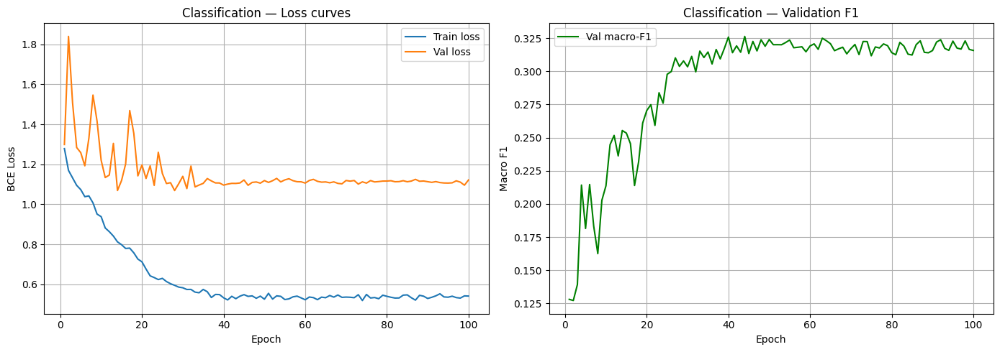

In [14]:
epochs = range(1, len(cls_history["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

Its clear with the gap between loss on training and validation sets that the above method is overfitting. The performance is still limited to an F1 score of 0.32 which is too less.
Before introducing regularisation technique, I would like to study the effect image augmentation.

In [15]:
# Instantiate the model
cls_model_aug = VocClassifier(target_labels=labels, dropout=0.0)

Image augmentation here performs 
1. Rotation
2. Color Jitter
3. Horizontal flip
4. Verticle flip
5. Blurring

This is done online. This doe snot allow the modle to memorise the data without increasing the size.

In [16]:
# Train the model and fill test_df classification columns.
# fit() handles the train/val split, dataloaders, loss, optimiser and
# scheduler internally — test_df[labels] is filled at the end automatically.
cls_history_aug = cls_model_aug.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.3544 | val_loss: 1.3249 | val_F1: 0.1356  ← best
Epoch   2/100 | train_loss: 1.2180 | val_loss: 1.2537 | val_F1: 0.1617  ← best
Epoch   3/100 | train_loss: 1.1859 | val_loss: 1.2345 | val_F1: 0.1809  ← best
Epoch   4/100 | train_loss: 1.1723 | val_loss: 1.2020 | val_F1: 0.1869  ← best
Epoch   5/100 | train_loss: 1.1692 | val_loss: 1.1963 | val_F1: 0.1975  ← best
Epoch   6/100 | train_loss: 1.1279 | val_loss: 1.2026 | val_F1: 0.1972
Epoch   7/100 | train_loss: 1.1168 | val_loss: 1.3208 | val_F1: 0.1794
Epoch   8/100 | train_loss: 1.1276 | val_loss: 1.2961 | val_F1: 0.1834
Epoch   9/100 | train_loss: 1.0898 | val_loss: 1.2845 | val_F1: 0.1954
Epoch  10/100 | train_loss: 1.0719 | val_loss: 1

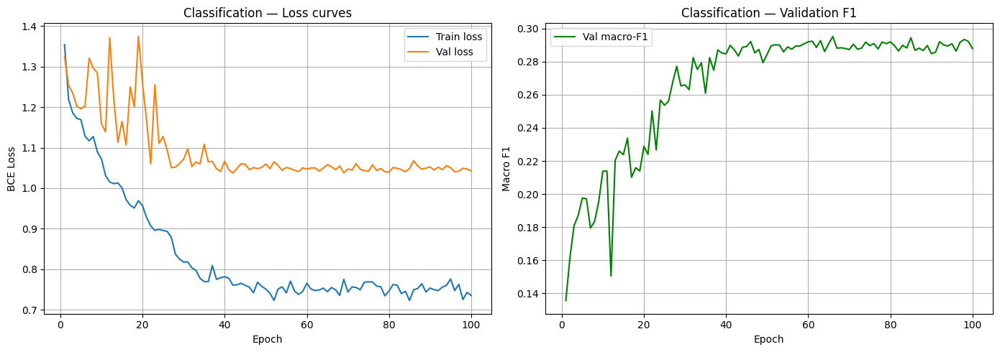

In [17]:
epochs = range(1, len(cls_history_aug["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_aug["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_aug["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_aug["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

Although image augmentation helps but it is still not enough to regularise the model. This is clear with the slight decrease in the validation set accuracy. In the next step, we introduce regularization by using random dropout of 0.2, so every iteration 20% of the neurons in the final header are dropped.

In [18]:
# Instantiate the model
cls_model_aug_drop_out = VocClassifier(target_labels=labels, dropout=0.2)

In [19]:
cls_history_aug_drop_out = cls_model_aug_drop_out.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.3732 | val_loss: 1.3331 | val_F1: 0.0977  ← best
Epoch   2/100 | train_loss: 1.2566 | val_loss: 1.2599 | val_F1: 0.1458  ← best
Epoch   3/100 | train_loss: 1.2267 | val_loss: 1.3045 | val_F1: 0.1458
Epoch   4/100 | train_loss: 1.2084 | val_loss: 1.2811 | val_F1: 0.1719  ← best
Epoch   5/100 | train_loss: 1.1904 | val_loss: 1.2760 | val_F1: 0.1338
Epoch   6/100 | train_loss: 1.1777 | val_loss: 1.3312 | val_F1: 0.1686
Epoch   7/100 | train_loss: 1.1368 | val_loss: 1.1662 | val_F1: 0.1988  ← best
Epoch   8/100 | train_loss: 1.1132 | val_loss: 1.4740 | val_F1: 0.1365
Epoch   9/100 | train_loss: 1.1041 | val_loss: 1.1676 | val_F1: 0.2155  ← best
Epoch  10/100 | train_loss: 1.0938 | val_loss: 1

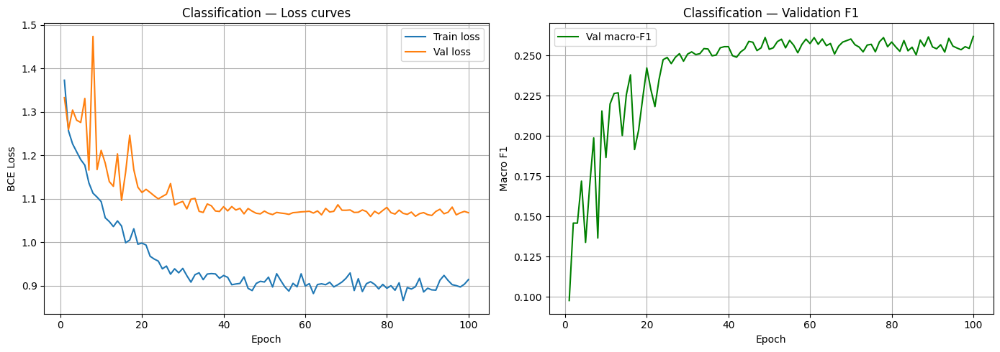

In [20]:
epochs = range(1, len(cls_history_aug_drop_out["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_aug_drop_out["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_aug_drop_out["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_aug_drop_out["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

The initial overfitting problem is solved as the gap between training loss and validation loss has reduced to ~0.15. We tested this model with test set, the resulting score is 0.128. So, now the problem is of model's performance rather than overfitting.

In [21]:
# generate submission — test_df already has the 20 label columns filled
generate_submission(test_df)

,Predicted
Id,
0_classification,2 1 9 1 12 4 18 3
0_segmentation,
1_classification,2 1 5 1 9 5 15 1 18 1 20 1
1_segmentation,
2_classification,2 1 5 1 9 1 11 2 15 2 18 1 20 1
...,...
747_segmentation,
748_classification,5 1 8 2 11 2 15 2 18 1 20 1
748_segmentation,


To enhance the result further, we employ individual class threshold. This is very useful as the dataset contains different number of training example for different classes, some better and some worse. So, the model may be confident in a few classes but not on all of them.

In [22]:
# rebuild val_df the same way fit() does internally
n_val  = int(len(train_df) * 0.15)
val_df = train_df.iloc[:n_val].reset_index(drop=True)

# tune thresholds
best_thresholds = tune_thresholds(cls_model, val_df, labels)

# predict on test set using tuned thresholds — one threshold per class
cls_model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((int(heights.mean()), int(widths.mean()))),
    transforms.ToTensor(),
])
test_loader = DataLoader(
    VOCDataset(test_df, labels, transform=val_transform, inference=True),
    batch_size=32, shuffle=False, num_workers=2
)

all_probs = []
with torch.no_grad():
    for imgs in test_loader:
        probs = torch.sigmoid(cls_model(imgs.to(device)))
        all_probs.append(probs.cpu())

all_probs = torch.cat(all_probs, dim=0).numpy()  # (N, 20)

# apply per-class thresholds
predictions = np.stack([
    (all_probs[:, c] > best_thresholds[c]).astype(int)
    for c in range(len(labels))
], axis=1)

test_df.loc[:, labels] = predictions

Class                 Best Threshold   F1 @ 0.5  F1 @ best
------------------------------------------------------------
aeroplane                       0.40     0.5000     0.6364
bicycle                         0.85     0.1667     0.4286
bird                            0.85     0.2143     0.4000
boat                            0.55     0.3846     0.4000
bottle                          0.75     0.1905     0.2353
bus                             0.75     0.0800     0.1667
car                             0.50     0.4186     0.4186
cat                             0.50     0.3000     0.3000
chair                           0.75     0.3684     0.4615
cow                             0.40     0.3333     0.4667
diningtable                     0.75     0.3704     0.5000
dog                             0.75     0.2051     0.2857
horse                           0.70     0.1429     0.1935
motorbike                       0.60     0.5625     0.6000
person                          0.50     0.6190     0.

In [23]:
# generate submission — test_df already has the 20 label columns filled
generate_submission(test_df)

,Predicted
Id,
0_classification,7 1 14 1
0_segmentation,
1_classification,8 2 11 1 13 1 18 1
1_segmentation,
2_classification,9 1 18 1
...,...
747_segmentation,
748_classification,8 2 11 1 16 1 18 1
748_segmentation,


With the tuned threshold, the score on the test set increased to 0.159. As tuning the threshold showed promising results, we turned this into a learnable parameter.

In [24]:
# Instantiate the model
cls_model_learnThres = VocClassifier(target_labels=labels, dropout=0.2, learnable_thres=True)

In [25]:
cls_history_learnThres = cls_model_learnThres.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.3717 | val_loss: 1.2954 | val_F1: 0.1092  ← best
Epoch   2/100 | train_loss: 1.2732 | val_loss: 1.2605 | val_F1: 0.1566  ← best
Epoch   3/100 | train_loss: 1.2251 | val_loss: 1.2540 | val_F1: 0.1818  ← best
Epoch   4/100 | train_loss: 1.2106 | val_loss: 1.2574 | val_F1: 0.1630
Epoch   5/100 | train_loss: 1.1838 | val_loss: 1.1995 | val_F1: 0.1893  ← best
Epoch   6/100 | train_loss: 1.1912 | val_loss: 1.2084 | val_F1: 0.1884
Epoch   7/100 | train_loss: 1.1728 | val_loss: 1.1902 | val_F1: 0.1809
Epoch   8/100 | train_loss: 1.1384 | val_loss: 1.2287 | val_F1: 0.1738
Epoch   9/100 | train_loss: 1.1323 | val_loss: 1.2815 | val_F1: 0.1621
Epoch  10/100 | train_loss: 1.1265 | val_loss: 1.2101 | 

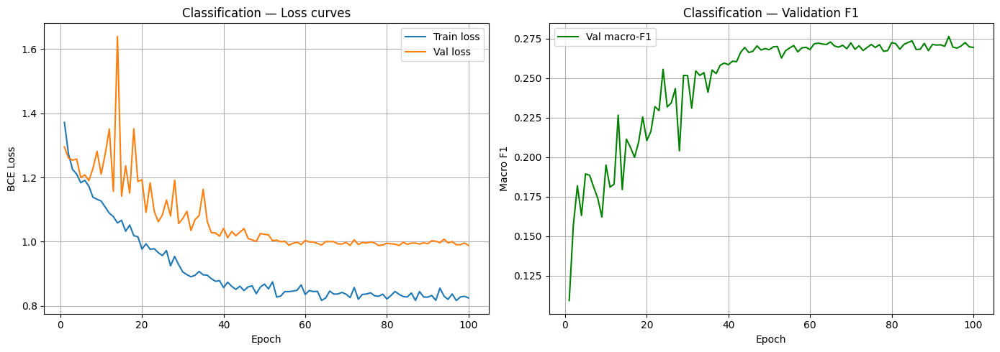

In [26]:
epochs = range(1, len(cls_history_learnThres["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_learnThres["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_learnThres["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_learnThres["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

To enable better classification capability, we increased the depth of the head. As the current head, maps 512 backbone to 20 binary decisions which may be too restrictive.

In [27]:
cls_model_deeperHead = VocClassifier(target_labels=labels, dropout=0.2, learnable_thres=True, deep_head=True, use_se=False)

In [28]:
cls_history_deeperHead = cls_model_deeperHead.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.3312 | val_loss: 1.2977 | val_F1: 0.1367  ← best
Epoch   2/100 | train_loss: 1.2745 | val_loss: 1.3179 | val_F1: 0.1530  ← best
Epoch   3/100 | train_loss: 1.2607 | val_loss: 1.2395 | val_F1: 0.1621  ← best
Epoch   4/100 | train_loss: 1.2438 | val_loss: 1.2548 | val_F1: 0.1554
Epoch   5/100 | train_loss: 1.2348 | val_loss: 1.2322 | val_F1: 0.1642  ← best
Epoch   6/100 | train_loss: 1.2249 | val_loss: 1.2571 | val_F1: 0.1602
Epoch   7/100 | train_loss: 1.2288 | val_loss: 1.2300 | val_F1: 0.1647  ← best
Epoch   8/100 | train_loss: 1.1980 | val_loss: 1.2298 | val_F1: 0.1984  ← best
Epoch   9/100 | train_loss: 1.1874 | val_loss: 1.2311 | val_F1: 0.1784
Epoch  10/100 | train_loss: 1.1933 | val

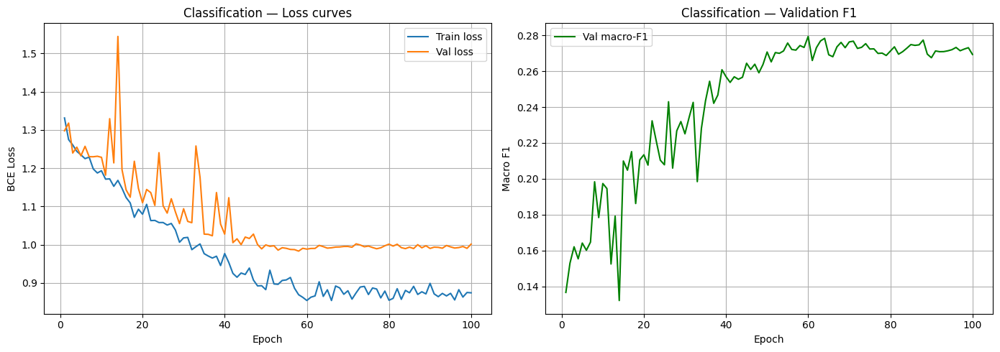

In [29]:
epochs = range(1, len(cls_history_deeperHead["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_deeperHead["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_deeperHead["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_deeperHead["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

After GAP, the 512-channel vector feeds into the classifier. Each of those 512 channels is a feature detector, some channels are highly relevant for detecting "person", others for "aeroplane", others for both or neither. Without SE, all 512 channels are weighted equally when making the final prediction.
SE blocks learn to reweight channels based on the input, essentially asking "given this specific image, which feature detectors are most informative right now?"

ResidualBlock + SE detail (stages 2–4):

                    ┌──────────────────────────┐
  input ────────────┤ Conv(3×3) + BN + ReLU    │
                    │ Conv(3×3) + BN            │───► feature map
                    └──────────────────────────┘         │
  input ──────────────────────────────────────────► + ──► ReLU ──► output
  (1×1 proj if                                      │
   channels change)                                 │
                                              ┌─────┘
                         SE block:            │ feature map
                    ┌────────────────────┐    │
                    │ GAP → (B, C)       │◄───┘
                    │ Linear(C → C//16)  │
                    │ ReLU               │
                    │ Linear(C//16 → C)  │
                    │ Sigmoid → scale    │
                    └────────┬───────────┘
                             │ scale (B, C, 1, 1)
                             ▼
                    feature map × scale ──────────► + ──► ReLU ──► output


SE reduction ratio = 16  (min 4 to avoid collapse on small channel counts)

In [30]:
cls_model_seBlocks = VocClassifier(target_labels=labels, dropout=0.2, learnable_thres=True, deep_head=True, use_se=True)

In [31]:
cls_history_seBlocks = cls_model_seBlocks.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 50,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')


Epoch   1/50 | train_loss: 1.3583 | val_loss: 1.2889 | val_F1: 0.1084  ← best
Epoch   2/50 | train_loss: 1.2657 | val_loss: 1.2564 | val_F1: 0.1613  ← best
Epoch   3/50 | train_loss: 1.2299 | val_loss: 1.2097 | val_F1: 0.1794  ← best
Epoch   4/50 | train_loss: 1.2396 | val_loss: 1.2216 | val_F1: 0.1805  ← best
Epoch   5/50 | train_loss: 1.2046 | val_loss: 1.2182 | val_F1: 0.1720
Epoch   6/50 | train_loss: 1.1882 | val_loss: 1.4944 | val_F1: 0.1073
Epoch   7/50 | train_loss: 1.1586 | val_loss: 1.3335 | val_F1: 0.1196
Epoch   8/50 | train_loss: 1.1607 | val_loss: 1.1844 | val_F1: 0.2098  ← best
Epoch   9/50 | train_loss: 1.1350 | val_loss: 1.1327 | val_F1: 0.2052
Epoch  10/50 | train_loss: 1.1311 | val_loss: 1.1805 | val_F1: 0.1899
Epoch  11/50 | train_loss: 1.1338 | val_loss: 1.1059 | val_F1: 0.2105  ← best
Epoch  12/50 | train_loss: 1.1086 | val_loss: 1.1841 | val_F1: 0.2020
Epoch  13/50 | train_loss: 1.0988 | val_loss: 1.1951 | val_F1: 0.1897
Epoch  14/50 | train_loss: 1.0893 | val_lo

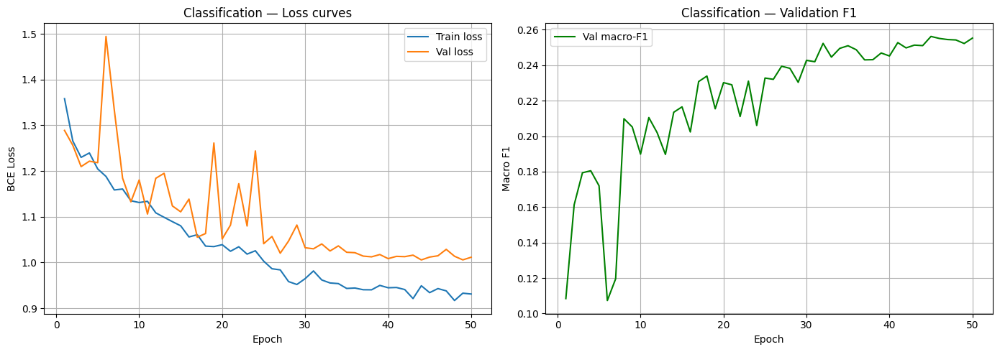

In [32]:
epochs = range(1, len(cls_history_seBlocks["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_seBlocks["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_seBlocks["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_seBlocks["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

In [33]:
# rebuild val_df the same way fit() does internally
n_val  = int(len(train_df) * 0.15)
val_df = train_df.iloc[:n_val].reset_index(drop=True)

# tune thresholds
best_thresholds = tune_thresholds(cls_model_seBlocks, val_df, labels)

# predict on test set using tuned thresholds — one threshold per class
cls_model_seBlocks.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((int(heights.mean()), int(widths.mean()))),
    transforms.ToTensor(),
])
test_loader = DataLoader(
    VOCDataset(test_df, labels, transform=val_transform, inference=True),
    batch_size=32, shuffle=False, num_workers=2
)

all_probs = []
with torch.no_grad():
    for imgs in test_loader:
        probs = torch.sigmoid(cls_model_seBlocks(imgs.to(device)))
        all_probs.append(probs.cpu())

all_probs = torch.cat(all_probs, dim=0).numpy()  # (N, 20)

# apply per-class thresholds
predictions = np.stack([
    (all_probs[:, c] > best_thresholds[c]).astype(int)
    for c in range(len(labels))
], axis=1)

test_df.loc[:, labels] = predictions

Class                 Best Threshold   F1 @ 0.5  F1 @ best
------------------------------------------------------------
aeroplane                       0.50     0.5185     0.5185
bicycle                         0.80     0.1034     0.5000
bird                            0.75     0.1905     0.2609
boat                            0.85     0.4103     0.6667
bottle                          0.55     0.2182     0.2500
bus                             0.70     0.1277     0.1667
car                             0.65     0.3571     0.4103
cat                             0.75     0.1818     0.2667
chair                           0.85     0.2642     0.3636
cow                             0.60     0.3243     0.4800
diningtable                     0.85     0.2273     0.6154
dog                             0.55     0.1404     0.1739
horse                           0.85     0.1277     0.2500
motorbike                       0.65     0.3333     0.4242
person                          0.50     0.6087     0.

In [34]:
# generate submission — test_df already has the 20 label columns filled
generate_submission(test_df)

,Predicted
Id,
0_classification,5 1 15 2 20 1
0_segmentation,
1_classification,5 1 10 1 12 1 15 2
1_segmentation,
2_classification,5 1 15 2 18 1 20 1
...,...
747_segmentation,
748_classification,5 1 8 1 12 1 15 2 18 1
748_segmentation,


The test accuracy with these models is still close to 0.115, hence all these changes did not improve the output.

The model is generalising well but simply not learning useful enough features. This led to the question of whether stage 5 was actually helping or just adding parameters without adding signal.

In [35]:
cls_model_lessStages = VocClassifier(target_labels=labels, dropout=0.2, learnable_thres=True, deep_head=True, use_se=True, num_stages=4)

In [36]:
cls_history_lessStages = cls_model_lessStages.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 50,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/50 | train_loss: 1.3319 | val_loss: 1.2829 | val_F1: 0.1263  ← best
Epoch   2/50 | train_loss: 1.2706 | val_loss: 1.2831 | val_F1: 0.1345  ← best
Epoch   3/50 | train_loss: 1.2706 | val_loss: 1.2344 | val_F1: 0.1628  ← best
Epoch   4/50 | train_loss: 1.2372 | val_loss: 1.2371 | val_F1: 0.1631  ← best
Epoch   5/50 | train_loss: 1.2199 | val_loss: 1.2480 | val_F1: 0.1561
Epoch   6/50 | train_loss: 1.2243 | val_loss: 1.3956 | val_F1: 0.1647  ← best
Epoch   7/50 | train_loss: 1.1995 | val_loss: 1.2088 | val_F1: 0.1680  ← best
Epoch   8/50 | train_loss: 1.1930 | val_loss: 1.2081 | val_F1: 0.1921  ← best
Epoch   9/50 | train_loss: 1.1985 | val_loss: 1.2128 | val_F1: 0.1817
Epoch  10/50 | train_loss: 1.1738 | val_l

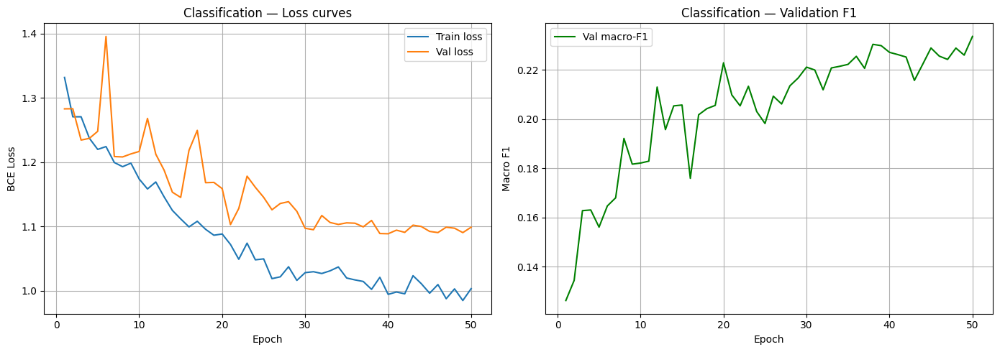

In [37]:
epochs = range(1, len(cls_history_lessStages["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_lessStages["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_lessStages["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_lessStages["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

In [38]:
cls_model_lessStages_3 = VocClassifier(target_labels=labels, dropout=0.2, learnable_thres=True, deep_head=True, use_se=True, num_stages=3)

In [39]:
cls_history_lessStages_3 = cls_model_lessStages_3.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 50,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')


Epoch   1/50 | train_loss: 1.3161 | val_loss: 1.2640 | val_F1: 0.1499  ← best
Epoch   2/50 | train_loss: 1.2522 | val_loss: 1.2479 | val_F1: 0.1494
Epoch   3/50 | train_loss: 1.2407 | val_loss: 1.2752 | val_F1: 0.1661  ← best
Epoch   4/50 | train_loss: 1.2155 | val_loss: 1.2713 | val_F1: 0.1656
Epoch   5/50 | train_loss: 1.2081 | val_loss: 1.2113 | val_F1: 0.1709  ← best
Epoch   6/50 | train_loss: 1.1834 | val_loss: 1.2484 | val_F1: 0.1741  ← best
Epoch   7/50 | train_loss: 1.1863 | val_loss: 1.2843 | val_F1: 0.1232
Epoch   8/50 | train_loss: 1.1873 | val_loss: 1.4303 | val_F1: 0.1592
Epoch   9/50 | train_loss: 1.1909 | val_loss: 1.1989 | val_F1: 0.1856  ← best
Epoch  10/50 | train_loss: 1.1614 | val_loss: 1.2189 | val_F1: 0.1811
Epoch  11/50 | train_loss: 1.1399 | val_loss: 1.2747 | val_F1: 0.1868  ← best
Epoch  12/50 | train_loss: 1.1483 | val_loss: 1.1691 | val_F1: 0.1811
Epoch  13/50 | train_loss: 1.1167 | val_loss: 1.2421 | val_F1: 0.1914  ← best
Epoch  14/50 | train_loss: 1.1540 

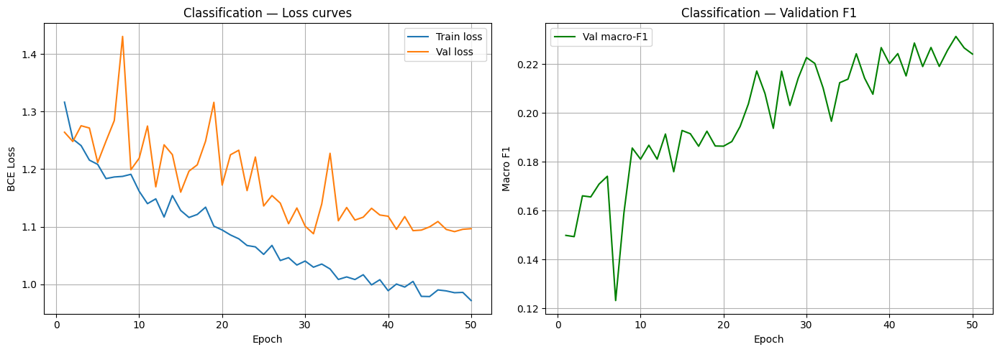

In [40]:
epochs = range(1, len(cls_history_lessStages_3["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_lessStages_3["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_lessStages_3["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_lessStages_3["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

In [43]:
cls_history_lessStages_3 = cls_model_lessStages_3.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 50,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/50 | train_loss: 1.0656 | val_loss: 1.1231 | val_F1: 0.2075  ← best
Epoch   2/50 | train_loss: 1.0210 | val_loss: 1.1715 | val_F1: 0.2036
Epoch   3/50 | train_loss: 1.0390 | val_loss: 1.3878 | val_F1: 0.2062
Epoch   4/50 | train_loss: 1.0483 | val_loss: 1.1148 | val_F1: 0.2125  ← best
Epoch   5/50 | train_loss: 1.0355 | val_loss: 1.1804 | val_F1: 0.1806
Epoch   6/50 | train_loss: 1.0194 | val_loss: 1.1499 | val_F1: 0.2114
Epoch   7/50 | train_loss: 1.0354 | val_loss: 1.1270 | val_F1: 0.2101
Epoch   8/50 | train_loss: 1.0213 | val_loss: 1.2764 | val_F1: 0.1991
Epoch   9/50 | train_loss: 1.0125 | val_loss: 1.2625 | val_F1: 0.2227  ← best
Epoch  10/50 | train_loss: 0.9904 | val_loss: 1.0737 | val_F1: 0.2310  ← 

As there is a clear performance drop when we reduce the number of layers, this proves that these layers are important. The next step is to check the effect of normalization here, as it centers the data distribution, resulting in easing the load of the network while learning the pattern.

In [41]:
# build normalize transform
voc_normalize = transforms.Normalize(mean.tolist(), std.tolist())
# without normalization — current behaviour unchanged
cls_model_norm = VocClassifier(target_labels=labels, dropout=0.2, learnable_thres=False, deep_head=False, use_se=False)

In [42]:
cls_history_norm = cls_model_norm.fit(
    train_df   = train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = True,
    normalize=voc_normalize
)

Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.3701 | val_loss: 1.2948 | val_F1: 0.1526  ← best
Epoch   2/100 | train_loss: 1.2420 | val_loss: 1.3427 | val_F1: 0.1310
Epoch   3/100 | train_loss: 1.1905 | val_loss: 1.2212 | val_F1: 0.1798  ← best
Epoch   4/100 | train_loss: 1.1997 | val_loss: 1.2102 | val_F1: 0.1899  ← best
Epoch   5/100 | train_loss: 1.1631 | val_loss: 1.1656 | val_F1: 0.1813
Epoch   6/100 | train_loss: 1.1762 | val_loss: 1.2016 | val_F1: 0.1901  ← best
Epoch   7/100 | train_loss: 1.1597 | val_loss: 1.1864 | val_F1: 0.2046  ← best
Epoch   8/100 | train_loss: 1.1270 | val_loss: 1.1581 | val_F1: 0.2064  ← best
Epoch   9/100 | train_loss: 1.1565 | val_loss: 1.1686 | val_F1: 0.2041
Epoch  10/100 | train_loss: 1.1106 | val

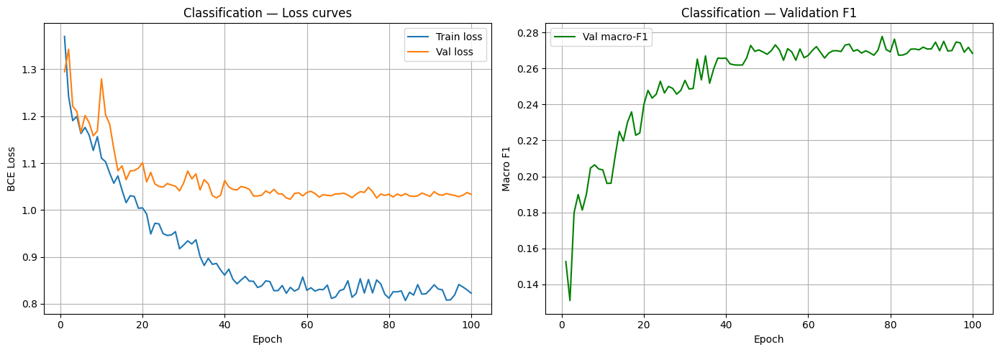

In [44]:
epochs = range(1, len(cls_history_norm["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_norm["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_norm["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_norm["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

Till now, we have tried to update the architecture and vary the data perception from the model's side using image augmentation and normalization. None of which has provided significant improvement. As a last step, we would try to increase the dataset artificially by using offline augmentation. This could be helpful in our scenario as the model shows good generalization but poor performance.

In [11]:
import numpy as np
import pandas as pd
from PIL import Image, ImageFilter
import copy

def augment_dataset(train_df, labels,
                    hflip=True, vflip=True,
                    color_jitter=True, blur=True,
                    rotation=True, rotation_angles=(-15, 15),
                    blur_radius=2.0,
                    jitter_brightness=0.3, jitter_contrast=0.3,
                    jitter_saturation=0.3, jitter_hue=0.05,
                    save_path=None):
    """
    Offline augmentation — generates fixed augmented copies of every
    training image and appends them to train_df.

    Each enabled augmentation produces one additional copy of every
    image with the same labels as the original. The combined dataframe
    is shuffled before being returned so augmented copies are not
    grouped next to their originals.

    Parameters
    ----------
    train_df          : pd.DataFrame  - original training dataframe
    labels            : list[str]     - the 20 VOC class column names
    hflip             : bool          - horizontal flip
    vflip             : bool          - vertical flip
    color_jitter      : bool          - random colour jitter
    blur              : bool          - gaussian blur
    rotation          : bool          - slight rotation
    rotation_angles   : tuple(int,int)- range of rotation angles in degrees
    blur_radius       : float         - gaussian blur radius
    jitter_brightness : float         - brightness jitter factor
    jitter_contrast   : float         - contrast jitter factor
    jitter_saturation : float         - saturation jitter factor
    jitter_hue        : float         - hue jitter factor (0–0.5)
    save_path         : str or None   - if provided, saves augmented images
                                        as .npy files to this directory

    Returns
    -------
    augmented_df : pd.DataFrame - original + augmented rows, shuffled
    """

    from torchvision import transforms
    import os

    if save_path is not None:
        os.makedirs(save_path, exist_ok=True)

    # ── Build list of (name, transform_fn) pairs ──────────────────────────
    augmentations = []

    if hflip:
        augmentations.append((
            "hflip",
            lambda img: img.transpose(Image.FLIP_LEFT_RIGHT)
        ))

    if vflip:
        augmentations.append((
            "vflip",
            lambda img: img.transpose(Image.FLIP_TOP_BOTTOM)
        ))

    if color_jitter:
        # torchvision ColorJitter operates on PIL images
        jitter_fn = transforms.ColorJitter(
            brightness = jitter_brightness,
            contrast   = jitter_contrast,
            saturation = jitter_saturation,
            hue        = jitter_hue
        )
        augmentations.append(("color_jitter", jitter_fn))

    if blur:
        augmentations.append((
            "blur",
            lambda img: img.filter(ImageFilter.GaussianBlur(radius=blur_radius))
        ))

    if rotation:
        # one copy per angle in rotation_angles
        for angle in rotation_angles:
            augmentations.append((
                f"rot_{angle}",
                # capture angle in default arg to avoid closure issue
                lambda img, a=angle: img.rotate(a, resample=Image.BILINEAR,
                                                expand=False)
            ))

    if not augmentations:
        print("No augmentations enabled — returning original train_df unchanged.")
        return train_df.copy()

    n_augs  = len(augmentations)
    n_orig  = len(train_df)
    print(f"Augmentations : {[name for name, _ in augmentations]}")
    print(f"Original rows : {n_orig}")
    print(f"New rows      : {n_orig * n_augs}")
    print(f"Total rows    : {n_orig * (n_augs + 1)}")
    print("Generating augmented images...")

    # ── Generate augmented rows ───────────────────────────────────────────
    augmented_rows = []

    for idx, row in train_df.iterrows():
        img_np  = row["img"].astype(np.uint8)
        pil_img = Image.fromarray(img_np)

        for aug_name, aug_fn in augmentations:
            aug_pil = aug_fn(pil_img)
            aug_np  = np.array(aug_pil).astype(np.uint8)

            # build new row — same labels, augmented image
            new_row        = row[labels].to_dict()
            new_row["img"] = aug_np

            # optionally save to disk as numpy array
            if save_path is not None:
                fname = os.path.join(save_path, f"{idx}_{aug_name}.npy")
                np.save(fname, aug_np)

            augmented_rows.append(new_row)

    # ── Combine and shuffle ───────────────────────────────────────────────
    augmented_df = pd.DataFrame(augmented_rows)
    combined_df  = pd.concat([train_df, augmented_df], ignore_index=True)
    combined_df  = combined_df.sample(frac=1, random_state=42).reset_index(drop=True)

    print(f"Done. Combined dataset: {len(combined_df)} rows.")
    return combined_df

In [12]:
# generate and keep in memory
augmented_train_df = augment_dataset(train_df, labels, vflip=True, blur=True, hflip=False, color_jitter=False, rotation=True)

# build normalize transform
voc_normalize = transforms.Normalize(mean.tolist(), std.tolist())
# then train on augmented dataset with online augmentation disabled
cls_model_offlineAug = VocClassifier(target_labels=labels, dropout=0.2)
cls_history_offlineAug = cls_model_offlineAug.fit(
    train_df   = augmented_train_df,
    test_df    = test_df,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    normalize=voc_normalize
)

Augmentations : ['vflip', 'blur', 'rot_-15', 'rot_15']
Original rows : 749
New rows      : 2996
Total rows    : 3745
Generating augmented images...


Done. Combined dataset: 3745 rows.
Using device  : cuda
Target classes: Index(['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat',
       'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person',
       'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'],
      dtype='str')
Epoch   1/100 | train_loss: 1.2301 | val_loss: 1.1428 | val_F1: 0.2014  ← best
Epoch   2/100 | train_loss: 1.1325 | val_loss: 1.0969 | val_F1: 0.2227  ← best
Epoch   3/100 | train_loss: 1.0712 | val_loss: 1.0624 | val_F1: 0.2240  ← best
Epoch   4/100 | train_loss: 1.0394 | val_loss: 1.0035 | val_F1: 0.2481  ← best
Epoch   5/100 | train_loss: 0.9937 | val_loss: 0.9622 | val_F1: 0.2579  ← best
Epoch   6/100 | train_loss: 0.9570 | val_loss: 0.9340 | val_F1: 0.2635  ← best
Epoch   7/100 | train_loss: 0.9399 | val_loss: 0.8918 | val_F1: 0.2812  ← best
Epoch   8/100 | train_loss: 0.8960 | val_loss: 0.8822 | val_F1: 0.2999  ← best
Epoch   9/100 | train_loss: 0.8661 | val_loss: 0.8849 | val_

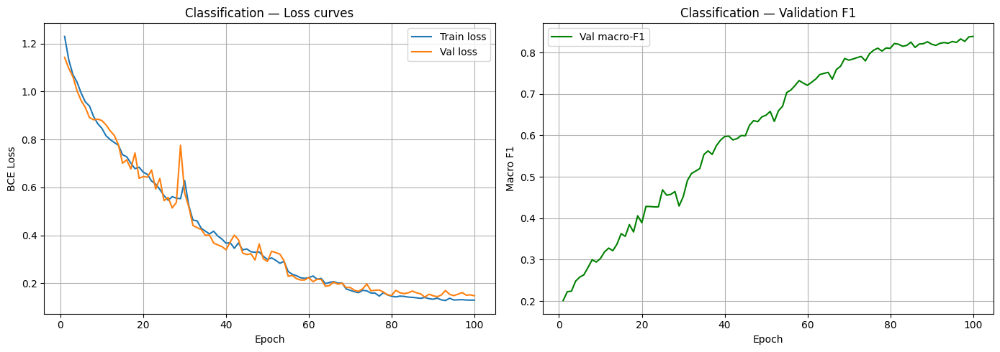

In [13]:
epochs = range(1, len(cls_history_offlineAug["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_offlineAug["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_offlineAug["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_offlineAug["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

It is clear with the performance improvement that the earlier bottleneck in the performance was just the limited dataset. We will consider this as our final model and save it.
This performance could improve further with the below recommendations:
1. Due to memory limitations, we could only try a limited set of image augmentations. With further augmentations, the dataset could be increased further.
2. A possible architectural improvement could be to use a shared network between classes, for example, an 8 stage network could be divided into 2 parts where the first part consist of shared 4 stages between all the classes and the second part is divided between groups of similar objects. So, classes cat, dog, horse, etc would come in animal whereas bike, bicycle, etc would be vehicles. This approach would help each class of object learn fine details while shared stages reduce the number of parameters.

In [14]:
# save
torch.save(cls_model_offlineAug.state_dict(), "final_cls_model_weights.pth")

# generate submission — test_df already has the 20 label columns filled
generate_submission(test_df)

# # load back
# cls_model = VocClassifier(num_classes=len(labels), dropout=0.2)
# cls_model.load_state_dict(torch.load("cls_model_weights.pth"))
# cls_model.eval()

,Predicted
Id,
0_classification,12 1 18 1
0_segmentation,
1_classification,9 1 11 1 15 1
1_segmentation,
2_classification,9 1 15 1
...,...
747_segmentation,
748_classification,9 1 18 1 20 1
748_segmentation,


# 2. Semantic segmentation
The goal here is to implement a segmentation model that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your model and compete on the test set (by filling in the segmentation column in the test dataframe).

In [ ]:
class RandomSegmentationModel:
    """
    Random segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def fit(self, X, Y):
        """
        Adjusts the class ratio variable to the one observed in Y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)

        Returns
        -------
        self
        """
        self.distribution = np.mean([[np.sum(Y_ == i) / Y_.size for i in range(len(labels) + 1)] for Y_ in Y], axis=0)
        print("Setting class distribution to:\nbackground: {}\n{}".format(self.distribution[0], "\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution[1:]))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        np.random.seed(0)
        return [np.random.choice(np.arange(len(labels) + 1), size=X_.shape[:2], p=self.distribution) for X_ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomSegmentationModel()
model.fit(train_df["img"], train_df["seg"])
test_df.loc[:, "seg"] = model.predict(test_df["img"])
test_df.head(1)

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [ ]:
generate_submission(test_df)

# 3. Adversarial attack
For this part, your goal is to fool your classification and/or segmentation model, using an *adversarial attack*. More specifically, the goal is build a network to perturb test images in a way that (i) they look unperturbed to humans; but (ii) the original model classifies/segments these images in line with the perturbations.

# 4. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Why did you make certain design choices? How are the models learning and performing? Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.